In [1]:
import romanpsf
import numpy as np
import matplotlib.pyplot as plt
import stpsf
import copy

**WARNING**: LOCAL JWST PRD VERSION PRDOPSSOC-072 DOESN'T MATCH THE CURRENT ONLINE VERSION PRDOPSSOC-073
Please consider updating pysiaf, e.g. pip install --upgrade pysiaf or conda update pysiaf


In [2]:
siaf=stpsf.stpsf_core.get_siaf_with_caching('roman')

In [3]:
#set up coordinate grid to show wide-angle WFI PSF, oversampled by 4
y,x=np.array(np.mgrid[0:500:.25,0:500:.25],dtype=float)-250-.125+1E-10
y*=.108
x*=.108
wave=1.6E-6

Now, let's set up STPSF to calculate wide-field PSFs for different WFI chips

In [4]:
wfi=stpsf.roman.WFI()
wfi.filter='PRISM'

Let's compare the STPSF and romanpsf calculations across the different chips

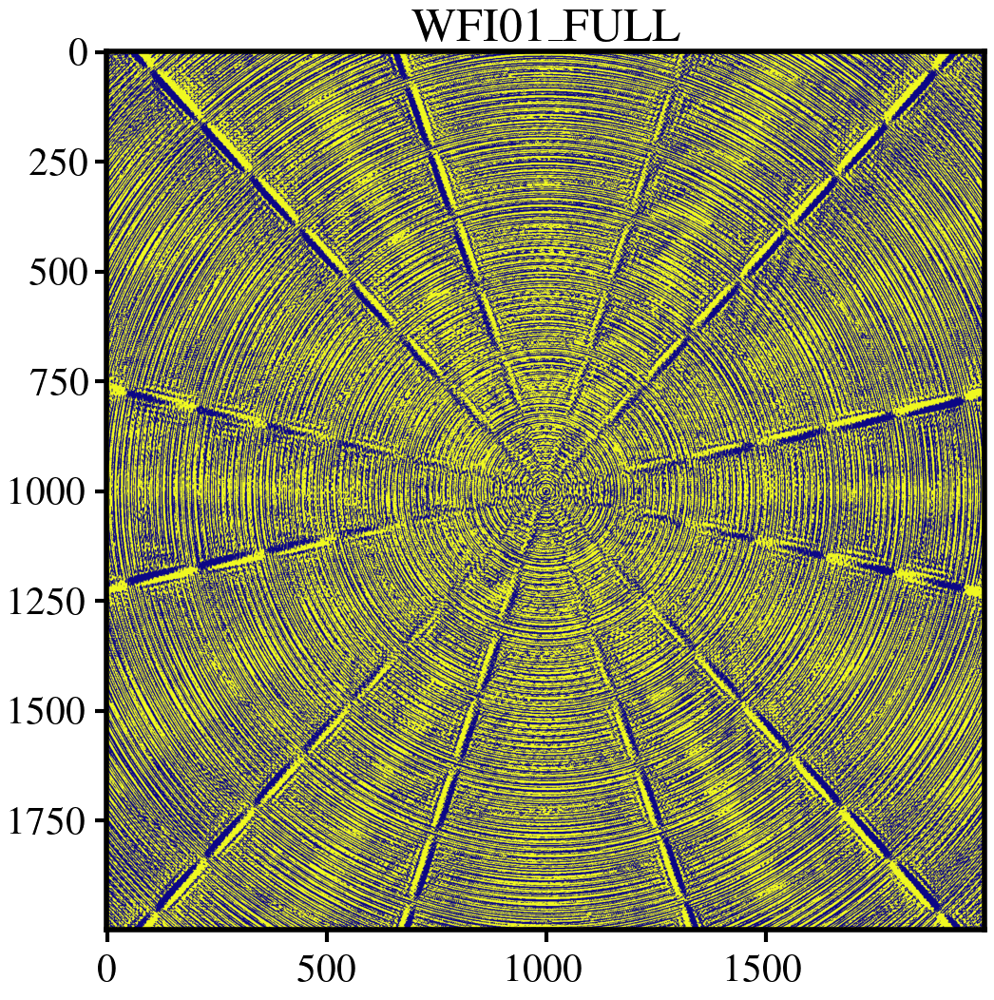

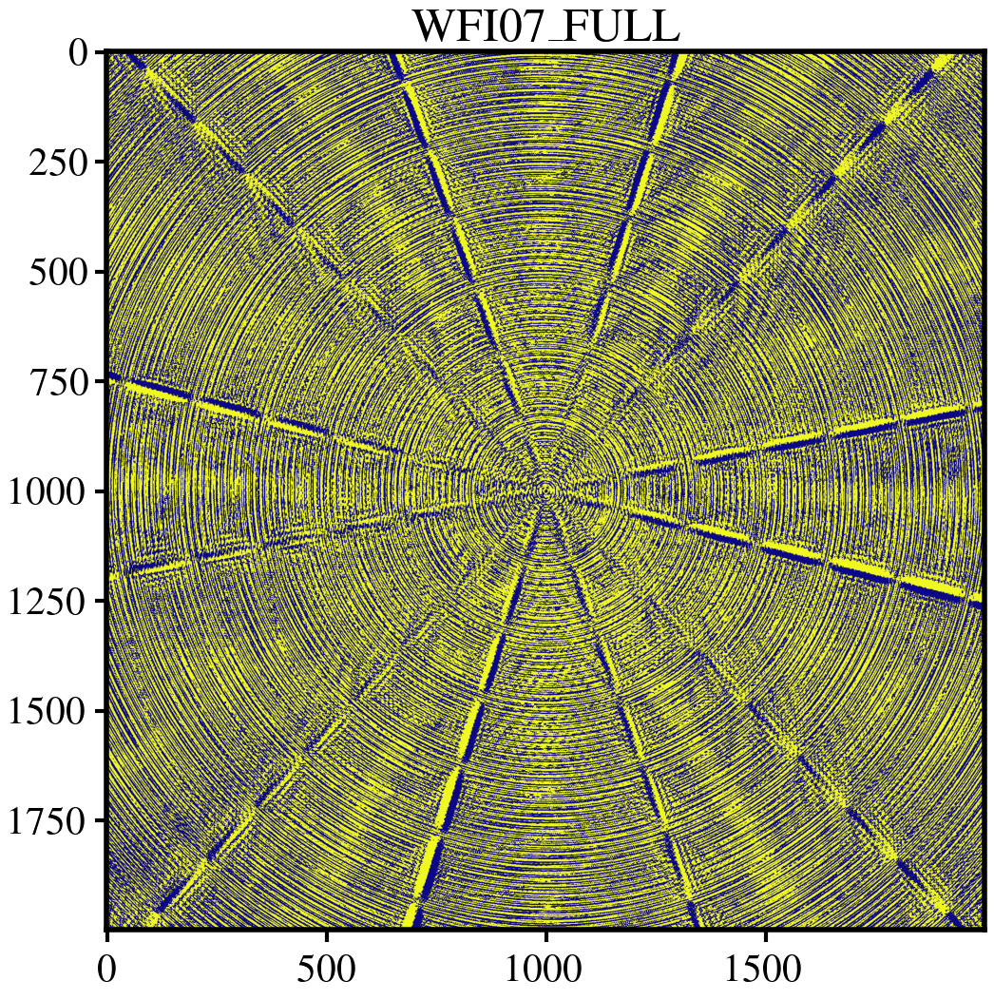

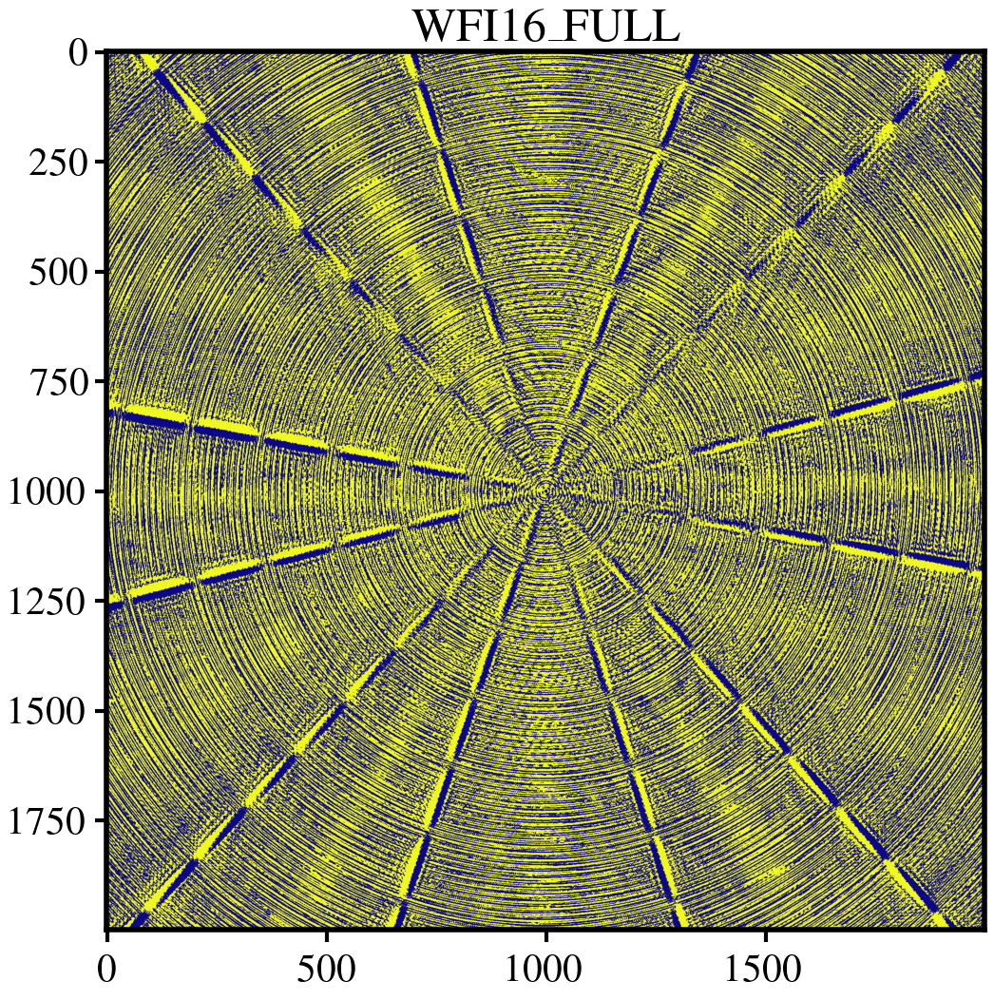

In [6]:
#loop over a couple detectors
#for det in range(1,19):
for det in [1,7,16]:
    #set up stpsf to calculate a 500 pixel (automatically subsampled by 4) PSF at 1.6 microns
    wfi.detector='WFI'+'%02d' % det
    pst=wfi.calc_psf(fov_pixels=500,monochromatic=wave)

    #to get the comparable romanpsf, we need the position of the star in the telescope frame
    thetax1,thetay1=siaf.apertures['WFI'+'%02d' % det+'_FULL'].idl_to_tel(0,0)
    #converted to radians
    thetax1*=np.pi/180/60/60
    thetay1*=np.pi/180/60/60

    #this creates a dictionary for romanpsf that describes the apparent positions of diffraction spikes based on the position
    #of the star in the telescope FOV
    bard=romanpsf.getbardict(thetax1,thetay1)

    #calculating the PSF is as simple as inputting the x and y coordinate offsets from the star (in arcsec)
    #the wavelength the PSF will be calculated at, and the above dictionary
    #the output will be the Fourier amplitude, you need to square it to get the intensity
    r=romanpsf.romanpsf(x,y,wave,barparam=bard)

    #let's compare STPSF and romanpsf
    #romanpsf returns the PSF in intensity/sq. arcsec., so a factor of .109^2/16 is needed to convert to detector units
    plt.imshow(pst[0].data-abs(r)**2/16*.109**2,vmin=-1E-12,vmax=1E-12)
    plt.title('WFI'+'%02d' % det+'_FULL')
    plt.show()

romanpsf also allows you to position the star at an arbitrary postion
For example, let's put the 10" to the right of the field of view

In [7]:
y,x=np.array(np.mgrid[0:500:.25,0:500:.25],dtype=float)-250-.125+1E-10
#convert to input units of arcsec
y*=.108
x*=.108

#all that is needed to move the star
x-=10/.108
wave=1.6E-6

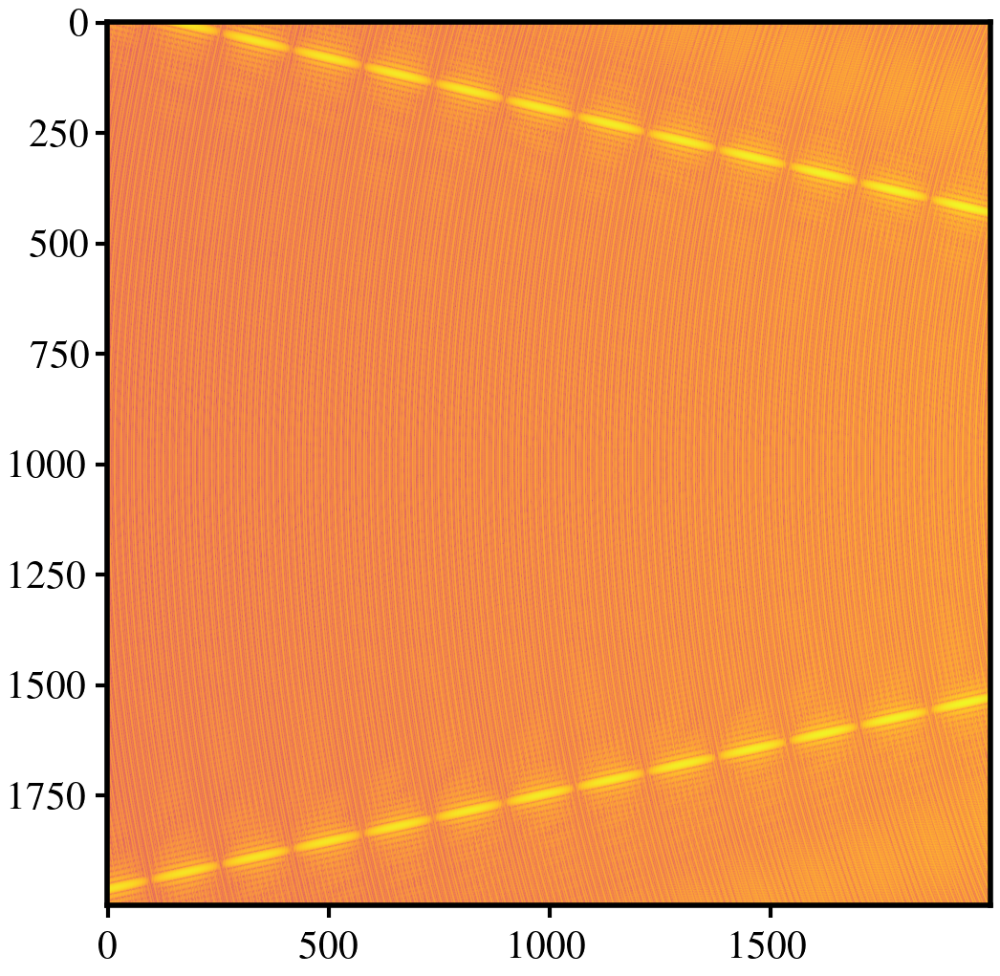

In [8]:
thetax1,thetay1=siaf.apertures['WFI01_FULL'].idl_to_tel(0,0)
thetax1*=np.pi/180/60/60
thetay1*=np.pi/180/60/60
bard=romanpsf.getbardict(thetax1,thetay1)
r=romanpsf.romanpsf(x,y,wave,barparam=bard)
plt.imshow(np.log10(abs(r)**2*.109**2/16))